In [ ]:
#importing Libraries
import os 
import numpy as np
import xml.etree.ElementTree as ET
from collections import OrderedDict
import matplotlib.pyplot as plt
import pandas as pd 

Loading dataset

In [3]:
dir_anno = "VOCdevkit/VOC2012/Annotations"
img_dir  = "VOCdevkit/VOC2012/JPEGImages"

In [4]:

ls $dir_anno | wc -l; ls $dir_anno | head -10


    5011
000005.xml
000007.xml
000009.xml
000012.xml
000016.xml
000017.xml
000019.xml
000020.xml
000021.xml
000023.xml


In [5]:
ls $img_dir | wc -l;ls $img_dir | head -10

    5011
000005.jpg
000007.jpg
000009.jpg
000012.jpg
000016.jpg
000017.jpg
000019.jpg
000020.jpg
000021.jpg
000023.jpg


In [6]:
def extract_single_xml_file(tree):
    Nobj = 0
    row  = OrderedDict()
    for elems in tree.iter():

        if elems.tag == "size":
            for elem in elems:
                row[elem.tag] = int(elem.text)
        if elems.tag == "object":
            for elem in elems:
                if elem.tag == "name":
                    row["bbx_{}_{}".format(Nobj,elem.tag)] = str(elem.text)              
                if elem.tag == "bndbox":
                    for k in elem:
                        row["bbx_{}_{}".format(Nobj,k.tag)] = float(k.text)
                    Nobj += 1
    row["Nobj"] = Nobj
    return(row)

df_anno = []
for fnm in os.listdir(dir_anno):  
    if not fnm.startswith('.'): ## do not include hidden folders/files
        tree = ET.parse(os.path.join(dir_anno,fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = fnm.split(".")[0]
        df_anno.append(row)
df_anno = pd.DataFrame(df_anno)

maxNobj = np.max(df_anno["Nobj"])


print("columns in df_anno\n-----------------")
for icol, colnm in enumerate(df_anno.columns):
    print("{:3.0f}: {}".format(icol,colnm))
print("-"*30)
print("df_anno.shape={}=(N frames, N columns)".format(df_anno.shape))
df_anno.head()


columns in df_anno
-----------------
  0: width
  1: height
  2: depth
  3: bbx_0_name
  4: bbx_0_xmin
  5: bbx_0_ymin
  6: bbx_0_xmax
  7: bbx_0_ymax
  8: bbx_1_name
  9: bbx_1_xmin
 10: bbx_1_ymin
 11: bbx_1_xmax
 12: bbx_1_ymax
 13: bbx_2_name
 14: bbx_2_xmin
 15: bbx_2_ymin
 16: bbx_2_xmax
 17: bbx_2_ymax
 18: bbx_3_name
 19: bbx_3_xmin
 20: bbx_3_ymin
 21: bbx_3_xmax
 22: bbx_3_ymax
 23: bbx_4_name
 24: bbx_4_xmin
 25: bbx_4_ymin
 26: bbx_4_xmax
 27: bbx_4_ymax
 28: bbx_5_name
 29: bbx_5_xmin
 30: bbx_5_ymin
 31: bbx_5_xmax
 32: bbx_5_ymax
 33: bbx_6_name
 34: bbx_6_xmin
 35: bbx_6_ymin
 36: bbx_6_xmax
 37: bbx_6_ymax
 38: Nobj
 39: fileID
 40: bbx_7_name
 41: bbx_7_xmin
 42: bbx_7_ymin
 43: bbx_7_xmax
 44: bbx_7_ymax
 45: bbx_8_name
 46: bbx_8_xmin
 47: bbx_8_ymin
 48: bbx_8_xmax
 49: bbx_8_ymax
 50: bbx_9_name
 51: bbx_9_xmin
 52: bbx_9_ymin
 53: bbx_9_xmax
 54: bbx_9_ymax
 55: bbx_10_name
 56: bbx_10_xmin
 57: bbx_10_ymin
 58: bbx_10_xmax
 59: bbx_10_ymax
 60: bbx_11_name
 61: 

,width,height,depth,bbx_0_name,bbx_0_xmin,bbx_0_ymin,bbx_0_xmax,bbx_0_ymax,bbx_1_name,bbx_1_xmin,...,bbx_40_name,bbx_40_xmin,bbx_40_ymin,bbx_40_xmax,bbx_40_ymax,bbx_41_name,bbx_41_xmin,bbx_41_ymin,bbx_41_xmax,bbx_41_ymax
0,500,375,3,diningtable,80.0,217.0,320.0,273.0,chair,197.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,500,332,3,horse,80.0,97.0,348.0,272.0,person,201.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,500,375,3,person,80.0,88.0,405.0,375.0,person,436.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,500,334,3,tvmonitor,430.0,121.0,500.0,205.0,person,192.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,500,375,3,bird,2.0,2.0,500.0,375.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:

# location to save df_anno.csv
dir_preprocessed = "VOCdevkit/VOC2012"
df_anno.to_csv(os.path.join(dir_preprocessed,"df_anno.csv"),index=False)


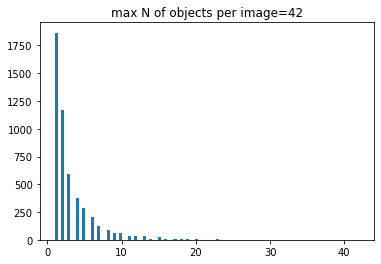

In [9]:
plt.hist(df_anno["Nobj"].values,bins=100)
plt.title("max N of objects per image={}".format(maxNobj))
plt.show()

Counter({'person': 5447, 'car': 1644, 'chair': 1432, 'bottle': 634, 'pottedplant': 625, 'bird': 599, 'dog': 538, 'sofa': 425, 'bicycle': 418, 'horse': 406, 'boat': 398, 'motorbike': 390, 'cat': 389, 'tvmonitor': 367, 'cow': 356, 'sheep': 353, 'aeroplane': 331, 'train': 328, 'diningtable': 310, 'bus': 272})


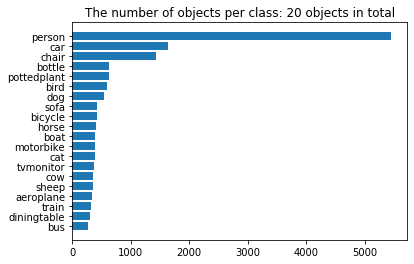

In [10]:
from collections import Counter
class_obj = []
for ibbx in range(maxNobj):
    class_obj.extend(df_anno["bbx_{}_name".format(ibbx)].values)
class_obj = np.array(class_obj)

count             = Counter(class_obj[class_obj != 'nan'])
print(count)
class_nm          = list(count.keys())
class_count       = list(count.values())
asort_class_count = np.argsort(class_count)

class_nm          = np.array(class_nm)[asort_class_count]
class_count       = np.array(class_count)[asort_class_count]

xs = range(len(class_count))
plt.barh(xs,class_count)
plt.yticks(xs,class_nm)
plt.title("The number of objects per class: {} objects in total".format(len(count)))
plt.show()

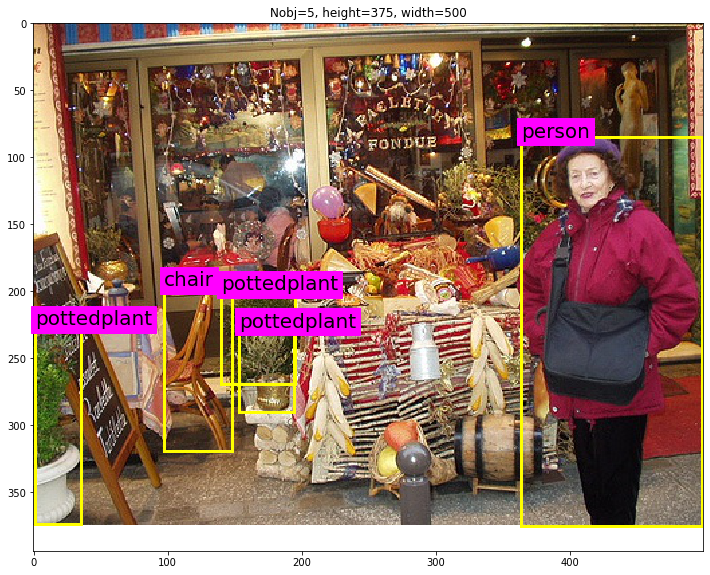

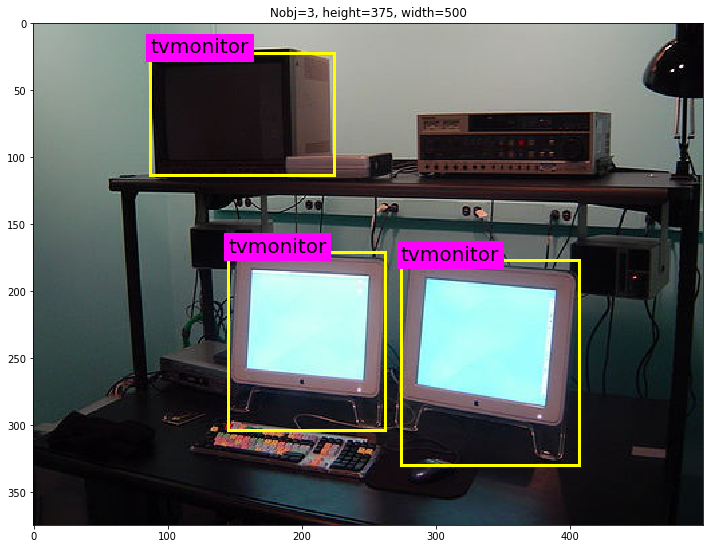

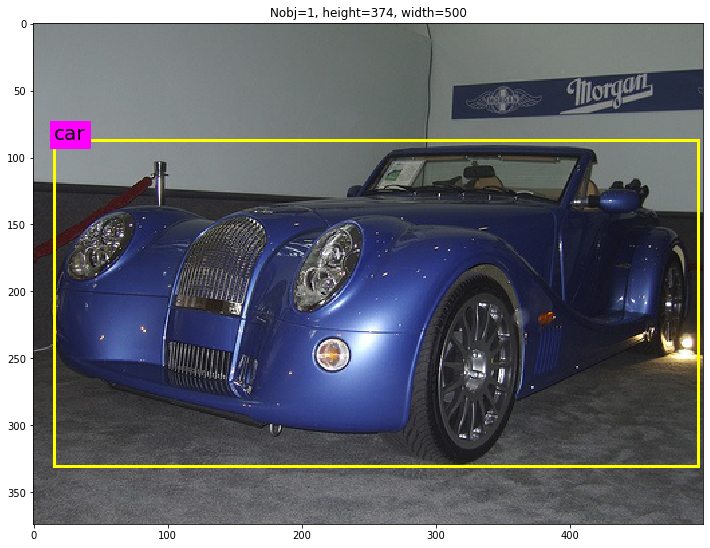

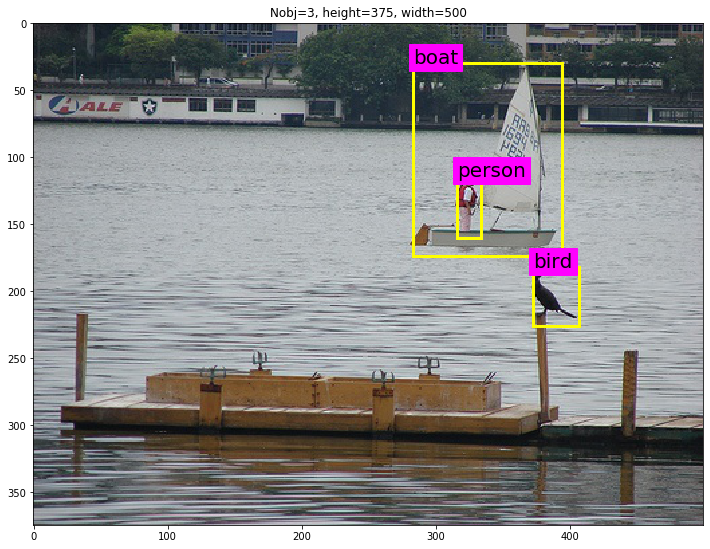

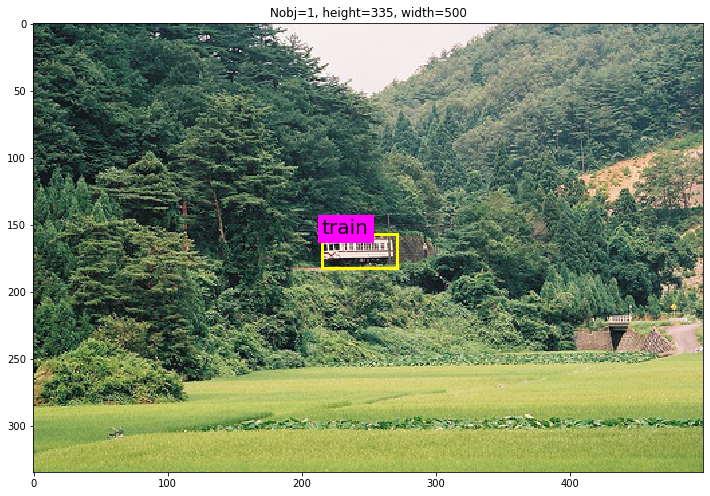

...

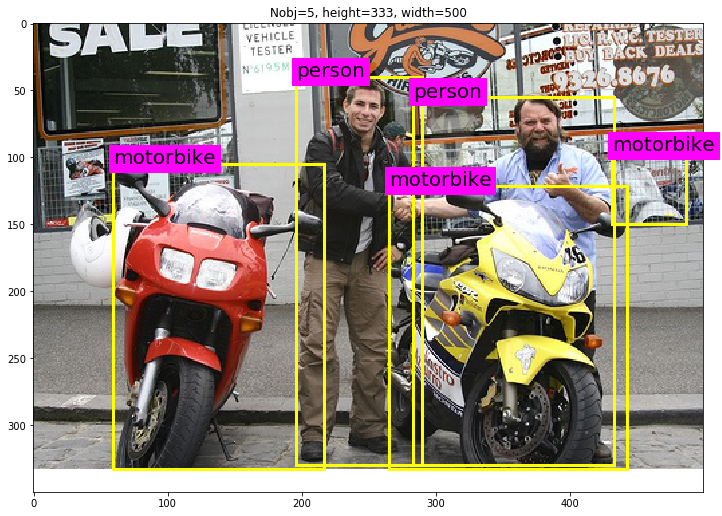

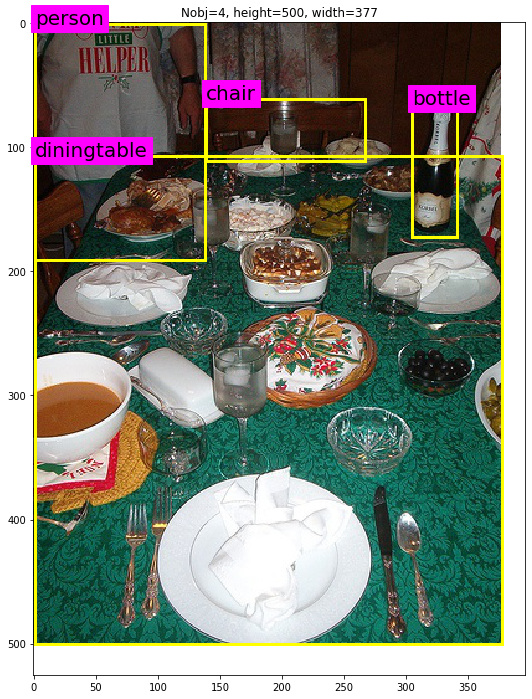

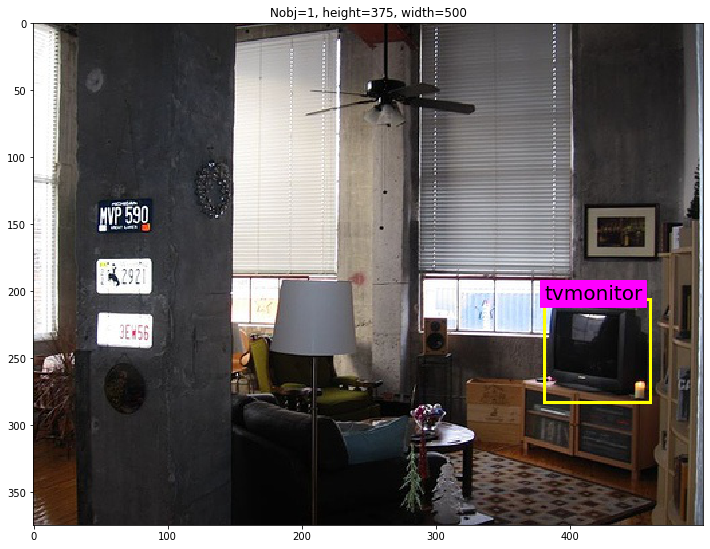

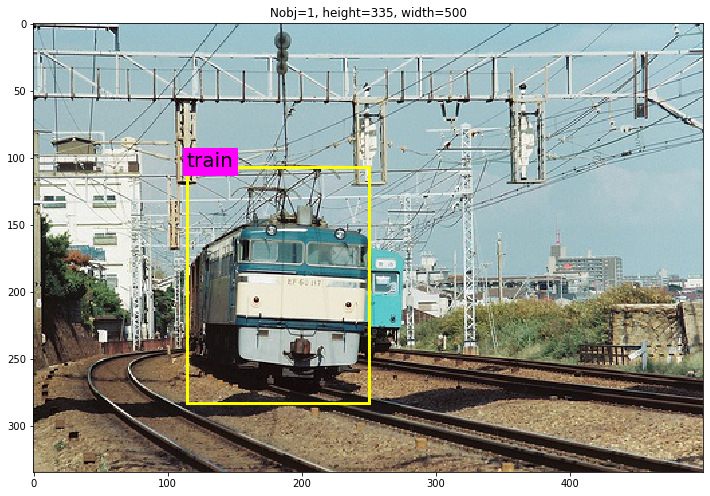

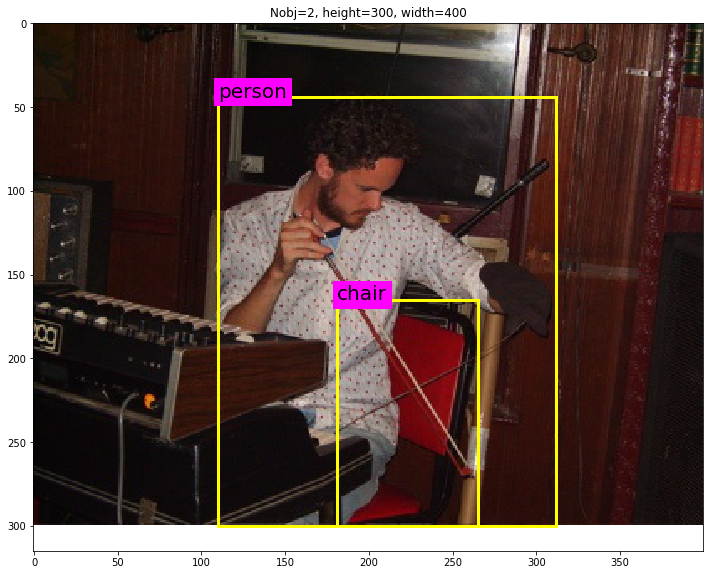

In [11]:
import imageio
def plt_rectangle(plt,label,x1,y1,x2,y2):
    '''
    == Input ==
    
    plt   : matplotlib.pyplot object
    label : string containing the object class name
    x1    : top left corner x coordinate
    y1    : top left corner y coordinate
    x2    : bottom right corner x coordinate
    y2    : bottom right corner y coordinate
    '''
    linewidth = 3
    color = "yellow"
    plt.text(x1,y1,label,fontsize=20,backgroundcolor="magenta")
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color)
    
# randomly select 20 frames    
size = 20    
ind_random = np.random.randint(0,df_anno.shape[0],size=size)
for irow in ind_random:
    row  = df_anno.iloc[irow,:]
    path = os.path.join(img_dir, row["fileID"] + ".jpg")
    # read in image
    img  = imageio.imread(path)

    plt.figure(figsize=(12,12))
    plt.imshow(img) # plot image
    plt.title("Nobj={}, height={}, width={}".format(row["Nobj"],row["height"],row["width"]))
    # for each object in the image, plot the bounding box
    for iplot in range(row["Nobj"]):
        plt_rectangle(plt,
                      label = row["bbx_{}_name".format(iplot)],
                      x1=row["bbx_{}_xmin".format(iplot)],
                      y1=row["bbx_{}_ymin".format(iplot)],
                      x2=row["bbx_{}_xmax".format(iplot)],
                      y2=row["bbx_{}_ymax".format(iplot)])
    plt.show() ## show the plot


In [15]:
import os 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd 
import scipy.misc
import imageio
import skimage.segmentation
import skimage.feature
from copy import copy

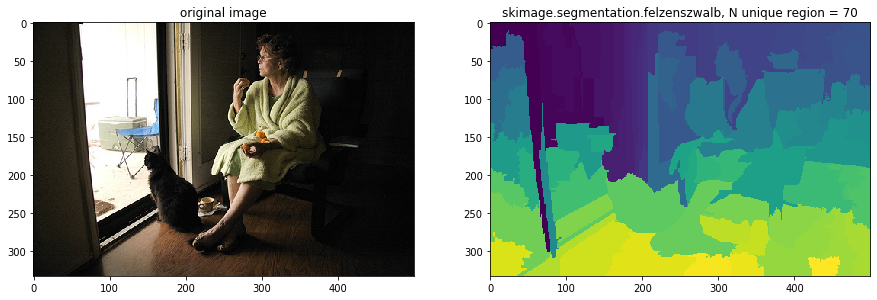

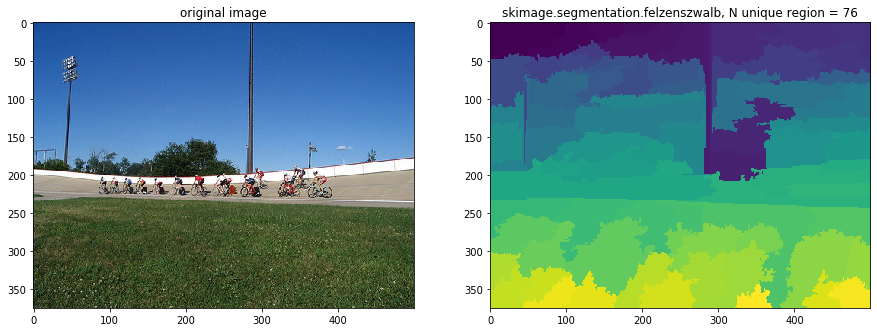

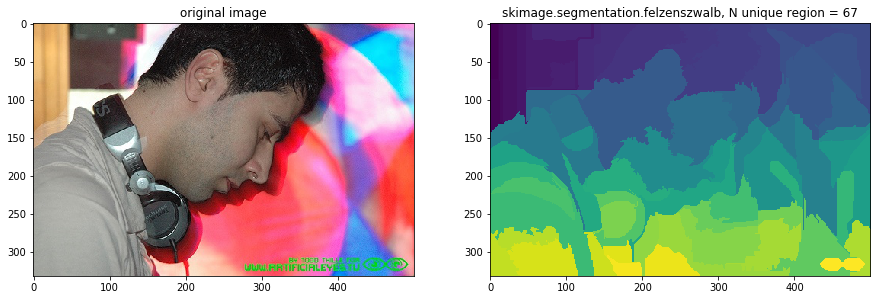

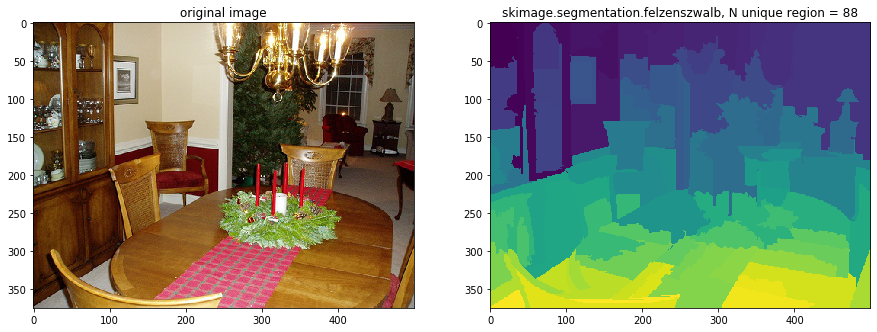

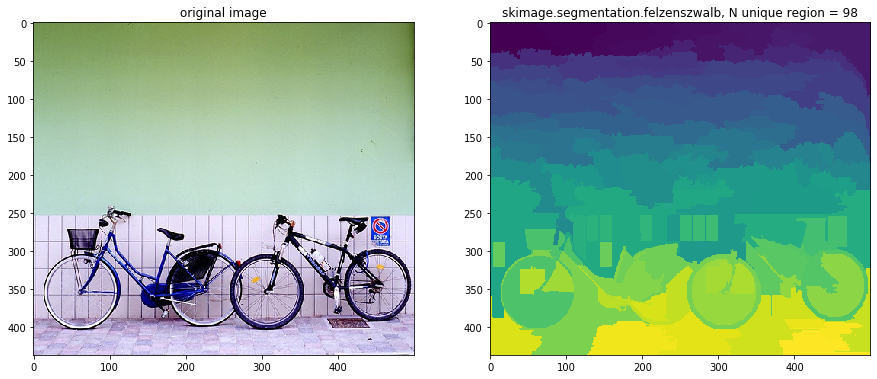

In [16]:
## This must be the location of the PASCAL VOC data. 
img_dir          = "VOCdevkit/VOC2012/JPEGImages"

def image_segmentation(img_8bit, scale = 1.0, sigma = 0.8, min_size = 50):
    
    # convert the image to range between 0 and 1
    img_float = skimage.util.img_as_float(img_8bit)
    im_mask   = skimage.segmentation.felzenszwalb(
                    img_float, 
                    scale    = scale, 
                    sigma    = sigma,
                    min_size = min_size)
    img       = np.dstack([img_8bit,im_mask])
    return(img)

scale    = 1.0
sigma    = 0.8
# min_size may be around 50 for better RCNN performance but for the sake of visualization
min_size = 500

np.random.seed(4)
listed_path = os.listdir(img_dir)
Nplot = 5
random_img_path = np.random.choice(listed_path,Nplot)
for imgnm in random_img_path:
    # import 8 bits degital image (each digit ranges between 0 - 255)
    img_8bit  = imageio.imread(os.path.join(img_dir,imgnm))
    img       = image_segmentation(img_8bit, scale, sigma, min_size)
    
    fig = plt.figure(figsize=(15,30))
    ax  = fig.add_subplot(1,2,1)
    ax.imshow(img_8bit)
    ax.set_title("original image")
    ax  = fig.add_subplot(1,2,2)
    ax.imshow(img[:,:,3])
    ax.set_title("skimage.segmentation.felzenszwalb, N unique region = {}".format(len(np.unique(img[:,:,3]))))
    plt.show()

In [17]:
def extract_region(img):
    
    ## only use the segmentation output
    img_segment = img[:,:,3]
    R = {}
    for y, i in enumerate(img_segment): ## along vertical axis 

        for x, l in enumerate(i): ## along horizontal axis
            # initialize a new region
            if l not in R:
                R[l] = {"min_x": np.Inf, 
                        "min_y": np.Inf,
                        "max_x": 0, 
                        "max_y": 0, 
                        "labels": [l]}

            # bounding box
            if R[l]["min_x"] > x:
                R[l]["min_x"] = x
            if R[l]["min_y"] > y:
                R[l]["min_y"] = y
            if R[l]["max_x"] < x:
                R[l]["max_x"] = x
            if R[l]["max_y"] < y:
                R[l]["max_y"] = y
    ## remove region if it does not have positive height or positive width
    
    Rcopy = copy(R)
    for key in R.keys():
        r = R[key]
        if (r["min_x"] == r["max_x"]) or (r["min_y"] == r["max_y"]):
            del Rcopy[key]
    return(Rcopy)
R = extract_region(img)
print("{} rectangle regions are found".format(len(R)))

98 rectangle regions are found


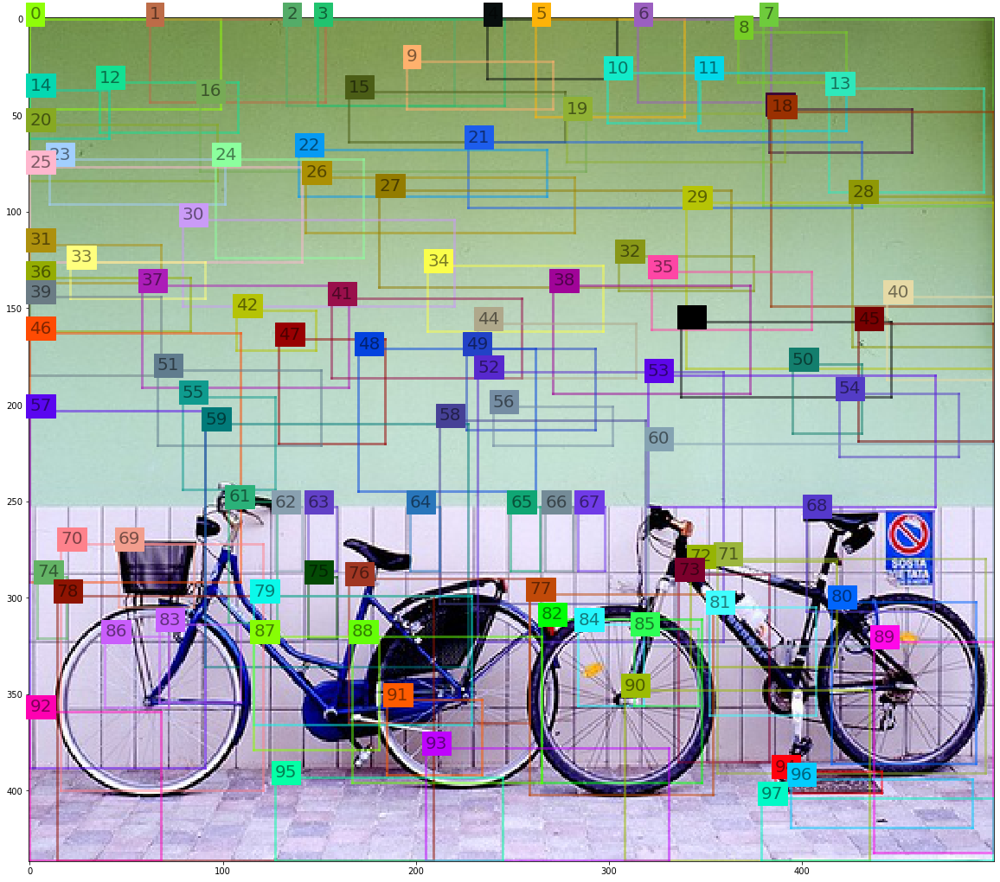

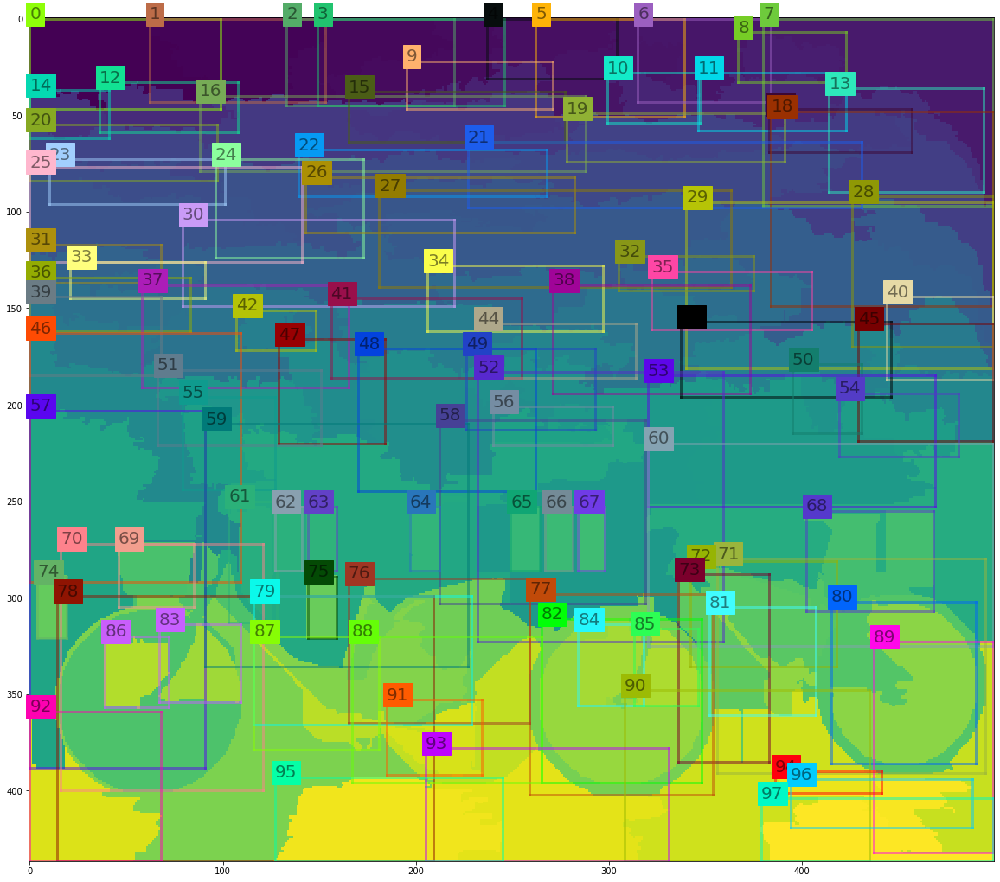

In [18]:
def plt_rectangle(plt,label,x1,y1,x2,y2,color = "yellow", alpha=0.5):
    linewidth = 3
    if type(label) == list:
        linewidth = len(label)*3 + 2
        label = ""
        
    plt.text(x1,y1,label,fontsize=20,backgroundcolor=color,alpha=alpha)
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color, alpha=alpha)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color, alpha=alpha)

figsize = (20,20)
plt.figure(figsize=figsize)    
plt.imshow(img[:,:,:3]/2**8)
for item, color in zip(R.values(),sns.xkcd_rgb.values()):
    x1 = item["min_x"]
    y1 = item["min_y"]
    x2 = item["max_x"]
    y2 = item["max_y"]
    label = item["labels"][0]
    plt_rectangle(plt,label,x1,y1,x2,y2,color=color)
plt.show()

plt.figure(figsize=figsize)    
plt.imshow(img[:,:,3])
for item, color in zip(R.values(),sns.xkcd_rgb.values()):
    x1 = item["min_x"]
    y1 = item["min_y"]
    x2 = item["max_x"]
    y2 = item["max_y"]
    label = item["labels"][0]
    plt_rectangle(plt,label,x1,y1,x2,y2,color=color)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


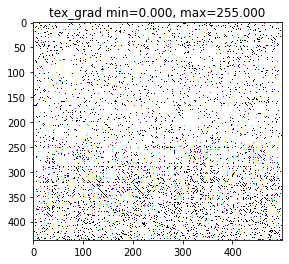

In [19]:
def calc_texture_gradient(img):

    ret = np.zeros(img.shape[:3])
    for colour_channel in (0, 1, 2):
        ret[:, :, colour_channel] = skimage.feature.local_binary_pattern(
            img[:, :, colour_channel], 8, 1.0)

    return ret


def plot_image_with_min_max(img,nm):
    img = img[:,:,:3]
    plt.imshow(img)
    plt.title("{} min={:5.3f}, max={:5.3f}".format(nm, np.min(img), np.max(img)))
    plt.show()

tex_grad = calc_texture_gradient(img)   
plot_image_with_min_max(tex_grad,nm="tex_grad")


/Users/venukorada/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))
/Users/venukorada/anaconda3/lib/python3.7/site-packages/skimage/color/colorconv.py:279: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = 4. + (arr[idx, 0] - arr[idx, 1]) / delta[idx]


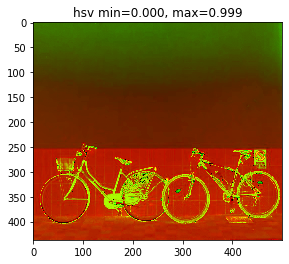

In [20]:
def calc_hsv(img):
    hsv = skimage.color.rgb2hsv(img[:,:,:3])
    return(hsv)

hsv = calc_hsv(img)
plot_image_with_min_max(hsv,nm="hsv")

keras model

In [30]:
import numpy as np
import pandas as pd
import os, sys 
import scipy.misc
import matplotlib.pyplot as plt
import random
import imageio
import skimage
print(sys.version)


3.7.3 (default, Mar 27 2019, 16:54:48) 
[Clang 4.0.1 (tags/RELEASE_401/final)]


In [32]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [34]:
pip install tensorflow

     |████████████████████████████████| 165.1MB 2.3MB/s eta 0:00:011
     |████████████████████████████████| 460kB 5.7MB/s eta 0:00:01
     |████████████████████████████████| 61kB 9.7MB/s  eta 0:00:01
     |████████████████████████████████| 3.6MB 8.0MB/s eta 0:00:01
     |████████████████████████████████| 71kB 15.1MB/s eta 0:00:01
     |████████████████████████████████| 133kB 4.4MB/s eta 0:00:01
     |████████████████████████████████| 51kB 12.9MB/s eta 0:00:01
     |████████████████████████████████| 3.0MB 12.2MB/s eta 0:00:01
     |████████████████████████████████| 1.0MB 7.8MB/s eta 0:00:01
     |████████████████████████████████| 10.6MB 3.7MB/s eta 0:00:01
     |████████████████████████████████| 122kB 6.6MB/s eta 0:00:01
     |████████████████████████████████| 102kB 11.0MB/s ta 0:00:01
     |████████████████████████████████| 788kB 8.6MB/s eta 0:00:01
     |████████████████████████████████| 51kB 8.4MB/s eta 0:00:01
     |████████████████████████████████| 163kB 4.7MB/s eta 0:00:01
     |

In [36]:
from keras.applications import VGG16
modelvgg16 = VGG16(include_top=True,weights='imagenet')
modelvgg16.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [37]:
from keras import models
modelvgg = models.Model(inputs  =  modelvgg16.inputs, 
                        outputs = modelvgg16.layers[-3].output)
## show the deep learning model
modelvgg.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)      

In [2]:
pip install selective_search

  Created wheel for selective-search: filename=selective_search-0.1.2.2-cp37-none-any.whl size=8985 sha256=03c563fb30077147b0b9bb6ad5741ad6cc2858ec97978bcc9a11d6acbe848af2
  Stored in directory: C:\Users\ashan\AppData\Local\pip\Cache\wheels\c9\a2\90\f19103d79bf171dbce304996899567f97cb480737408050071
Successfully built selective-search
Note: you may need to restart the kernel to use updated packages.


In [3]:
import selective_search as ss

img_dir   = "VOC2012/JPEGImages"
imgnm     = "000083.jpg"

# import 8 bits degital image (each digit ranges between 0 - 255)
img_8bit  = imageio.imread(os.path.join(img_dir,imgnm))
## region proposal codes 
regions  = ss.get_region_proposal(img_8bit,min_size=50)
print("{} candidate regions are proposed.".format(len(regions)))


NameError: name 'imageio' is not defined

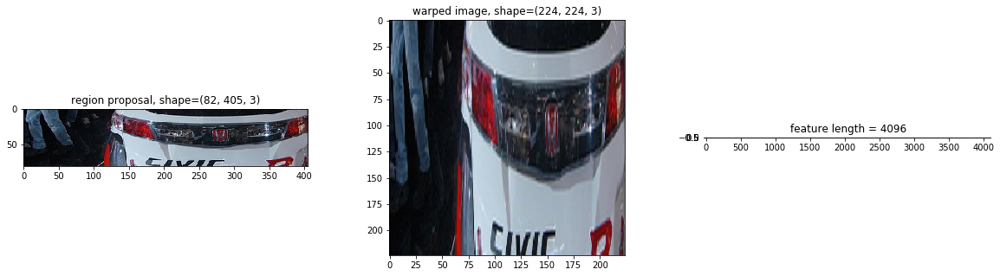

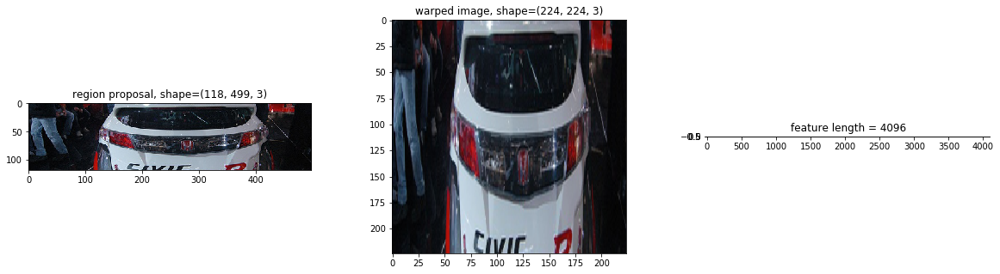

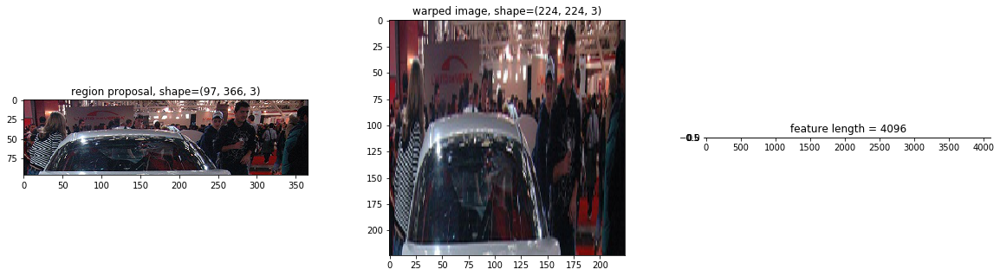

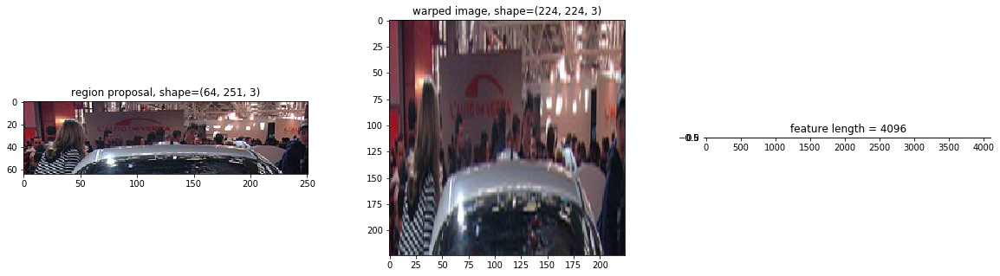

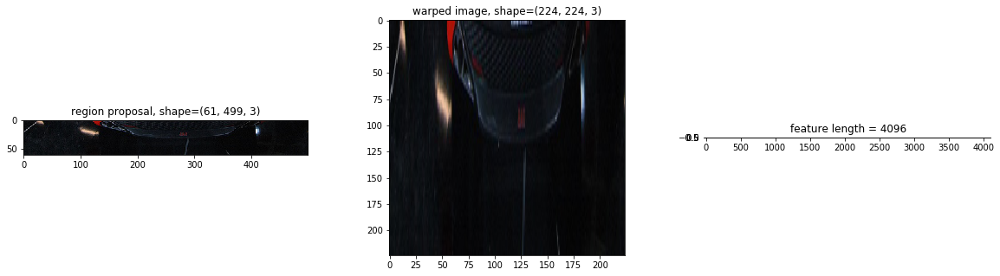

In [42]:

def warp(img, newsize):
    
    img_resize = skimage.transform.resize(img,newsize)
    return(img_resize)


warped_size = (224, 224)
X = []
for i in [151,165,171,169,175]:
    r = regions[i]
    ## extract a single candidate region
    x , y , width, height = r["rect"]
    img_bb     = img_8bit[y:y + height,x:x + width]
    ## warp image
    img_warped = warp(img_bb, warped_size)
    ## create CNN feature
    feature = modelvgg.predict(img_warped.reshape(1,warped_size[0],warped_size[1],3))
    
    fig = plt.figure(figsize=(20,5))
    ax = fig.add_subplot(1,3,1)
    ax.imshow(img_bb)
    ax.set_title("region proposal, shape={}".format(img_bb.shape))
    
    ax = fig.add_subplot(1,3,2)
    ax.imshow(img_warped)
    ax.set_title("warped image, shape={}".format(img_warped.shape))

    ax = fig.add_subplot(1,3,3)    
    ax.imshow(feature, cmap='hot')
    ax.set_title("feature length = {}".format(len(feature.flatten())))
    plt.show()


In [43]:
# location to save df_anno.csv
import pandas as pd
dir_preprocessed = "VOCdevkit/VOC2007"
df_anno = pd.read_csv(os.path.join(dir_preprocessed,"df_anno.csv"))

/Users/venukorada/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (120,125,130,135,140,145,150,155,160,165,170,175,180,185,190,195,200,205,210) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [44]:
cols_bbx = []
for colnm in df_anno.columns:
    if "name" in colnm:
        cols_bbx.append(colnm)
bbx_has_personTF = df_anno[cols_bbx].values == "person"
pick = np.any(bbx_has_personTF,axis=1)
df_anno_person = df_anno.loc[pick,:]


In [45]:
import pickle
IoU_cutoff_object     = 0.7
IoU_cutoff_not_object = 0.4
objnms = ["image0","info0","image1","info1"]  
dir_result = "result"

In [46]:
import time 
start = time.time()   
# the "rough" ratio between the region candidate with and without objects.
N_img_without_obj = 2 
newsize = (300,400) ## hack
image0, image1, info0,info1 = [], [], [], [] 
for irow in range(df_anno_person.shape[0]):
    ## extract a single frame that contains at least one person object
    row  = df_anno_person.iloc[irow,:]
    ## read in the corresponding frame
    path = os.path.join(img_dir,row["fileID"] + ".jpg")
    img  = imageio.imread(path)
    orig_h, orig_w, _ = img.shape
    ## to reduce the computation speed,
    ## I will do a small hack here. I will resize all the images into newsize = (200,250)    
    img  = warp(img, newsize)
    orig_nh, orig_nw, _ = img.shape
    ## region candidates for this frame
    regions = ss.get_region_proposal(img,min_size=50)[::-1]
    
    ## for each object that exists in the data,
    ## find if the candidate regions contain the person
    for ibb in range(row["Nobj"]): 

        name = row["bbx_{}_name".format(ibb)]
        if name != "person": ## if this object is not person, move on to the next object
            continue 
        if irow % 50 == 0:
            print("frameID = {:04.0f}/{}, BBXID = {:02.0f},  N region proposals = {}, N regions with an object gathered till now = {}".format(
                    irow, df_anno_person.shape[0], ibb, len(regions), len(image1)))
        
        ## extract the bounding box of the person object  
        multx, multy  = orig_nw/orig_w, orig_nh/orig_h 
        true_xmin     = row["bbx_{}_xmin".format(ibb)]*multx
        true_ymin     = row["bbx_{}_ymin".format(ibb)]*multy
        true_xmax     = row["bbx_{}_xmax".format(ibb)]*multx
        true_ymax     = row["bbx_{}_ymax".format(ibb)]*multy
        
        
        person_found_TF = 0
        _image1 = None
        _image0, _info0  = [],[]
        ## for each candidate region, find if this person object is included
        for r in regions:
            
            prpl_xmin, prpl_ymin, prpl_width, prpl_height = r["rect"]
            ## calculate IoU between the candidate region and the object
            IoU = ss.get_IOU(prpl_xmin, prpl_ymin, prpl_xmin + prpl_width, prpl_ymin + prpl_height,
                             true_xmin, true_ymin, true_xmax, true_ymax)
            ## candidate region numpy array
            img_bb = np.array(img[prpl_ymin:prpl_ymin + prpl_height,
                                  prpl_xmin:prpl_xmin + prpl_width])
            
            info = [irow, prpl_xmin, prpl_ymin, prpl_width, prpl_height]
            if IoU > IoU_cutoff_object:
                _image1 = img_bb
                _info1  = info
                break
            elif IoU < IoU_cutoff_not_object:
                _image0.append(img_bb) 
                _info0.append(info) 
        if _image1 is not None:
            # record all the regions with the objects
            image1.append(_image1)
            info1.append(_info1)
            if len(_info0) >= N_img_without_obj: ## record only 2 regions without objects
                # downsample the candidate regions without object 
                # so that the training does not have too much class imbalance. 
                # randomly select N_img_without_obj many frames out of all the sampled images without objects.
                pick = np.random.choice(np.arange(len(_info0)),N_img_without_obj)
                image0.extend([_image0[i] for i in pick ])    
                info0.extend( [_info0[i]  for i in pick ])  

        
end = time.time()  
print("TIME TOOK : {}MIN".format((end-start)/60))

### Save image0, info0, image1, info1 
objs   = [image0,info0,image1,info1]        
for obj, nm in zip(objs,objnms):
    with open(os.path.join(dir_result ,'{}.pickle'.format(nm)), 'wb') as handle:
        pickle.dump(obj, 
                    handle, protocol=pickle.HIGHEST_PROTOCOL)


TypeError: ufunc 'add' did not contain a loop with signature matching types dtype('<U21') dtype('<U21') dtype('<U21')

# utils

In [47]:
import numpy as np
import torch
import torch.nn as nn

def estimate_weights(labels):
    '''
    reference from https://github.com/ai-med/quickNAT_pytorch
    Estimate weights which balance the relative importance of pixesl in the LogitsticLoss
    more detailed in https://arxiv.org/pdf/1801.04161.pdf
    '''
    
    if torch.is_tensor(labels):
         labels = labels.cpu().numpy()
        
    class_weights = np.zeros_like(labels)
    unique, counts = np.unique(labels, return_counts=True)
    median_freq = np.median(counts)
    
    for i, label in enumerate(unique):
        class_weights += (median_freq // counts[i]) * np.array(labels == label)
    
    grads = np.gradient(labels)
    edge_weights = (grads[0] ** 2 + grads[1] ** 2) > 0
    class_weights += 2 * edge_weights
    
    class_weights = torch.tensor(class_weights).float()
    
    return class_weights


def make_one_hot(labels, num_classes, device):
    '''
    Converts an integer label to a one-hot values.

    Parameters
    ----------
        labels : N x H x W, where N is batch size.(torch.Tensor)
        num_classes : int
        device: torch.device information
    -------
    Returns
        target : torch.Tensor on given device
        N x C x H x W, where C is class number. One-hot encoded.
    '''
    
    labels=labels.unsqueeze(1)
    one_hot = torch.FloatTensor(labels.size(0), num_classes, labels.size(2), labels.size(3)).zero_()
    one_hot = one_hot.to(device)
    target = one_hot.scatter_(1, labels.data, 1) 
    return target


def save_metrics(metrics, size, loss, cross = None, dice = None):
    '''
    loss value save in metrics
    '''
    
    if cross is not None:
        metrics['cross'] += cross.data.cpu().numpy() * size
    
    if dice is not None:
        metrics['dice'] += dice.data.cpu().numpy() * size
        
    metrics['loss'] += loss.data.cpu().numpy() * size

def print_metrics(metrics, epoch_size, phase):    
    '''
    print metrics which saves loss value
    '''
    
    outputs = []
    
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_size))
        
    print("{}: {}".format(phase, ", ".join(outputs)))

ModuleNotFoundError: No module named 'torch'

# loss

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys, os.path
#from util import estimate_weights, make_one_hot

def dice_score(pred, encoded_target):
    """
    :param pred : N x C x H x W logits
    :param encoded_target : N x C x H x W LongTensor
    """
    
    output = F.softmax(pred, dim = 1)
    
    eps = 1
 
    intersection = output * encoded_target
    numerator = 2 * intersection.sum(0).sum(1).sum(1) + eps
    denominator = output + encoded_target
    denominator = denominator.sum(0).sum(1).sum(1) + eps
    
    loss_per_channel = numerator / denominator
    
    score = loss_per_channel.sum() / output.size(1)

    del output, encoded_target

    return score.mean()


def dice_loss(pred, encoded_target):
    """
    :param pred : N x C x H x W logits
    :param encoded_target : N x C x H x W LongTensor
    """
    
    output = F.softmax(pred, dim = 1)
    
    eps = 1
 
    intersection = output * encoded_target
    numerator = 2 * intersection.sum(0).sum(1).sum(1) + eps
    denominator = output + encoded_target
    denominator = denominator.sum(0).sum(1).sum(1) + eps
    
    loss_per_channel = 1 - (numerator / denominator)
    
    loss = loss_per_channel.sum() / output.size(1)
    del output, encoded_target
    
    return loss.mean()


def cross_entropy_loss(pred, target, weight):
    """
    :param pred : N x C x H x W
    :param target : N x H x W
    :param: weight : N x H x W
    
    """
    
    loss_func = nn.CrossEntropyLoss()
    
    loss = loss_func(pred, target)
        
    return torch.mean(torch.mul(loss, weight))

def combined_loss(pred, target, device, n_classes):
    """
    :param pred: N x C x H x W
    :param target: N x H x W
    """
    
    weights = estimate_weights(target.float())
    weights = weights.to(device)
       
    cross = cross_entropy_loss(pred, target, weights)
    
    target_oh = make_one_hot(target.long(), n_classes, device)
    
    dice = dice_loss(pred, target_oh)
    
    loss = cross + dice
    
    del weights
    
    return loss, cross, dice

In [ ]:
# pip install torchsummary

# train

In [ ]:
import numpy as np
import torch 
import torch.nn as nn
import torch.nn.functional as F
import os
import sys
from torch.autograd import Variable
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.utils.data.sampler import SubsetRandomSampler
from sklearn.model_selection import train_test_split
from torchsummary import summary
from collections import defaultdict
import copy
import pickle

from optparse import OptionParser

#from dataset import SampleDataset
#from model import UNet, SegNet, DenseNet
#from util import save_metrics, print_metrics
#from loss import combined_loss

def get_args():
    
    parser = OptionParser()
    parser.add_option('--data_path', dest='data_path',type='string',
                      default='data/samples', help='data path')
    parser.add_option('--epochs', dest='epochs', default=50, type='int',
                      help='number of epochs')
    parser.add_option('--classes', dest='classes', default=28, type='int',
                      help='number of classes')
    parser.add_option('--channels', dest='channels', default=1, type='int',
                      help='number of channels')
    parser.add_option('--width', dest='width', default=256, type='int',
                      help='image width')
    parser.add_option('--height', dest='height', default=256, type='int',
                      help='image height')
    parser.add_option('--model', dest='model', type='string',
                      help='model name(UNet, SegNet, DenseNet)')
    parser.add_option('--gpu', dest='gpu',type='string',
                      default='gpu', help='gpu or cpu')
    parser.add_option('--device1', dest='device1', default=0, type='int',
                      help='device1 index number')
    parser.add_option('--device2', dest='device2', default=-1, type='int',
                      help='device2 index number')
    parser.add_option('--device3', dest='device3', default=-1, type='int',
                      help='device3 index number')
    parser.add_option('--device4', dest='device4', default=-1, type='int',
                      help='device4 index number')

    (options, args) = parser.parse_args()
    return options

def train_net(model):
    
    data_path = "VOC2012/data/JPEGImages"
    num_epochs = 5
    n_classes = args.classes
    data_width = args.width
    data_height = args.height
    
    # set device configuration
    device_ids = []
    
    if gpu == 'gpu' :
        
        if not torch.cuda.is_available() :
            print("No cuda available")
            raise exit
            
        device = torch.device(args.device1)
        
        device_ids.append(args.device1)
        
        if args.device2 != -1 :
            device_ids.append(args.device2)
            
        if args.device3 != -1 :
            device_ids.append(args.device3)
        
        if args.device4 != -1 :
            device_ids.append(args.device4)
        
    
    else :
        device = torch.device("cpu")
    
    if len(device_ids) > 1:
        model = nn.DataParallel(model, device_ids = device_ids)
        
    model = model.to(device)

    # set image into training and validation dataset
    
    train_dataset = SampleDataset(data_path)

    print('total image : {}'.format(len(train_dataset)))

    train_indices, val_indices = train_test_split(np.arange(len(train_dataset)), test_size=0.2, random_state=42)

    train_sampler = SubsetRandomSampler(train_indices)
    valid_sampler = SubsetRandomSampler(val_indices)

    train_loader = DataLoader(
        train_dataset,
        batch_size=20,
        num_workers=4,
        sampler=train_sampler
    )

    val_loader = DataLoader(
        train_dataset,
        batch_size=10,
        num_workers=4,
        sampler=valid_sampler
    )
    
    model_folder = os.path.abspath('./checkpoints')
    if not os.path.exists(model_folder):
        os.mkdir(model_folder)
    
    elif args.model == 'SegNet':
        model_path = os.path.join(model_folder, 'SegNet.pth')
    
        
    # set optimizer
    
    optimizer = torch.optim.Adam(model.parameters())


    # main train
    
    display_steps = 30
    best_loss = 1e10
    loss_history = []

    ## for early stopping 
    early_stop = False
    patience = 7
    counter = 0

    for epoch in range(num_epochs):
        print('Starting epoch {}/{}'.format(epoch+1, num_epochs))

        # train
        model.train()

        metrics = defaultdict(float)
        epoch_size = 0
        
        # train model
        for batch_idx, (images, masks) in enumerate(train_loader):
            
            images = images.to(device).float()
            masks = masks.to(device).long()

            optimizer.zero_grad()
            outputs = model(images)

            loss, cross, dice = combined_loss(outputs, masks.squeeze(1), device, n_classes)

            save_metrics(metrics, images.size(0), loss, cross, dice)

            loss.backward()
            optimizer.step()

            # statistics
            epoch_size += images.size(0)

            if batch_idx % display_steps == 0:
                print('    ', end='')
                print('batch {:>3}/{:>3} cross: {:.4f} , dice {:.4f} , combined_loss {:.4f}\r'\
                      .format(batch_idx+1, len(train_loader), cross.item(), dice.item(),loss.item()))

            del images, masks, outputs, loss, cross, dice

        print_metrics(metrics, epoch_size, 'train')

        # evalute
        print('Finished epoch {}, starting evaluation'.format(epoch+1))
        model.eval()

        # validate model
        for images, masks in val_loader:
            images = images.to(device).float()
            masks = masks.to(device).long()

            outputs = model(images)

            loss, cross, dice = combined_loss(outputs, masks.squeeze(1), device, n_classes)

            save_metrics(metrics, images.size(0), loss, cross, dice)

            # statistics
            epoch_size += images.size(0)

            del images, masks, outputs, loss, cross, dice

        print_metrics(metrics, epoch_size, 'val')

        epoch_loss = metrics['loss'] / epoch_size

        # save model if best validation loss
        if epoch_loss < best_loss:
            print("saving best model")
            best_loss = epoch_loss

            model_copy = copy.deepcopy(model)
            model_copy = model_copy.cpu()

            model_state_dict = model_copy.module.state_dict() if len(device_ids) > 1 else model_copy.state_dict()
            torch.save(model_state_dict, model_path)

            del model_copy

            counter = 0

        else:
            counter += 1
            print('EarlyStopping counter : {:>3} / {:>3}'.format(counter, patience))

            if counter >= patience :
                early_stop = True

        loss_history.append(best_loss)
        print('Best val loss: {:4f}'.format(best_loss))

        if early_stop :
            print('Early Stopping')
            break
        
    return loss_history
    
    
if __name__ == "__main__":

    
    model = SegNet(in_channels = 1, n_classes = 28)
        
    loss_history = train_net(model)
    
    # save validation loss history
    with open('./checkpoints/validation_losses', 'wb') as fp:
        pickle.dump(loss_history, fp)

# DAG

In [ ]:
import numpy as np
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
import pickle
import random
import sys
import os

from model import UNet, SegNet, DenseNet

from dataset import SampleDataset
from scipy.stats import rice
from skimage.measure import compare_ssim as ssim
from dag import DAG
from dag_utils import generate_target, generate_target_swap
from util import make_one_hot

from optparse import OptionParser

BATCH_SIZE = 10


def get_args():
    
    parser = OptionParser()
    parser.add_option('--data_path', dest='data_path',type='string',
                      default='data/samples', help='data path')
    parser.add_option('--attack_path', dest='attack_path',type='string',
                      default=None, help='the path of adversarial attack examples')
    parser.add_option('--model_path', dest='model_path',type='string',
                      help='model_path')
    parser.add_option('--classes', dest='classes', default=28, type='int',
                      help='number of classes')
    parser.add_option('--channels', dest='channels', default=1, type='int',
                      help='number of channels')
    parser.add_option('--width', dest='width', default=256, type='int',
                      help='image width')
    parser.add_option('--height', dest='height', default=256, type='int',
                      help='image height')
    parser.add_option('--model', dest='model', type='string',
                      help='model name(UNet, SegNet, DenseNet)')
    parser.add_option('--attacks', dest='attacks', type='string',
                      help='attack types: Rician, DAG_A, DAG_B, DAG_C')
    parser.add_option('--gpu', dest='gpu',type='string',
                      default='gpu', help='gpu or cpu')
    parser.add_option('--device1', dest='device1', default=0, type='int',
                      help='device1 index number')
    parser.add_option('--device2', dest='device2', default=-1, type='int',
                      help='device2 index number')
    parser.add_option('--device3', dest='device3', default=-1, type='int',
                      help='device3 index number')
    parser.add_option('--device4', dest='device4', default=-1, type='int',
                      help='device4 index number')

    (options, args) = parser.parse_args()
    return options

def load_data(args):
    
    data_path = args.data_path
    n_classes = args.classes
    data_width = args.width
    data_height = args.height
    
    # generate loader
    test_dataset = SampleDataset(data_path)
    
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        num_workers=4,
    )
    
    print('test_dataset : {}, test_loader : {}'.format(len(test_dataset), len(test_loader)))
    
    
    return test_dataset, test_loader

# generate Rician noise examples
# Meausre the difference between original and adversarial examples by using structural Similarity (SSIM). 
# The adversarial examples which has SSIM value from 0.97 to 0.99 can be passed.
# SSIM adapted from https://scikit-image.org/docs/dev/auto_examples/transform/plot_ssim.html
def Rician(test_dataset):
    
    def generate_rician(image):
    
        ssim_noise = 0

        if torch.is_tensor(image):
            image = image.numpy()

        rician_image = np.zeros_like(image)

        while ssim_noise <= 0.97 or ssim_noise >= 0.99:
            b = random.uniform(0, 1)
            rv = rice(b)
            rician_image = rv.pdf(image)
            ssim_noise =  ssim(image[0], rician_image[0], data_range=rician_image[0].max() - rician_image[0].min())

        #print('ssim : {:.2f}'.format(ssim_noise))

        return rician_image

    adversarial_examples = []
    
    for batch_idx in range(len(test_dataset)):
        
        image, labels = test_dataset.__getitem__(batch_idx)

        rician_image = generate_rician(image)

        #print("image {} save".format(batch_idx))

        adversarial_examples.append([rician_image[0],labels.squeeze(0).numpy()])

    print('total {} Rician noise images are generated'.format(len(adversarial_examples)))
    
    return adversarial_examples


def DAG_Attack(model, test_dataset, args):
    
    # Hyperparamter for DAG 
    
    num_iterations=20
    gamma=0.5
    num=15
    
    gpu = args.gpu
    
    # set device configuration
    device_ids = []
    
    if gpu == 'gpu' :
        
        if not torch.cuda.is_available() :
            print("No cuda available")
            raise SystemExit
            
        device = torch.device(args.device1)
        
        device_ids.append(args.device1)
        
        if args.device2 != -1 :
            device_ids.append(args.device2)
            
        if args.device3 != -1 :
            device_ids.append(args.device3)
        
        if args.device4 != -1 :
            device_ids.append(args.device4)
        
    
    else :
        device = torch.device("cpu")
    
    if len(device_ids) > 1:
        model = nn.DataParallel(model, device_ids = device_ids)
        
    model = model.to(device)
    
    adversarial_examples = []
    
    for batch_idx in range(len(test_dataset)):
        image, label = test_dataset.__getitem__(batch_idx)

        image = image.unsqueeze(0)
        pure_label = label.squeeze(0).numpy()

        image , label = image.clone().detach().requires_grad_(True).float(), label.clone().detach().float()
        image , label = image.to(device), label.to(device)

        # Change labels from [batch_size, height, width] to [batch_size, num_classes, height, width]
        label_oh=make_one_hot(label.long(),n_classes,device)

        if args.attacks == 'DAG_A':

            adv_target = torch.zeros_like(label_oh)

        elif args.attacks == 'DAG_B':

            adv_target=generate_target_swap(label_oh.cpu().numpy())
            adv_target=torch.from_numpy(adv_target).float()

        elif args.attacks == 'DAG_C':
            
            # choice one randome particular class except background class(0)
            unique_label = torch.unique(label)
            target_class = int(random.choice(unique_label[1:]).item())

            adv_target=generate_target(label_oh.cpu().numpy(), target_class = target_class)
            adv_target=torch.from_numpy(adv_target).float()

        else :
            print("wrong adversarial attack types : must be DAG_A, DAG_B, or DAG_C")
            raise SystemExit


        adv_target=adv_target.to(device)

        _, _, _, _, _, image_iteration=DAG(model=model,
                  image=image,
                  ground_truth=label_oh,
                  adv_target=adv_target,
                  num_iterations=num_iterations,
                  gamma=gamma,
                  no_background=True,
                  background_class=0,
                  device=device,
                  verbose=False)

        if len(image_iteration) >= 1:

            adversarial_examples.append([image_iteration[-1],
                                         pure_label])

        del image_iteration
    
    print('total {} {} images are generated'.format(len(adversarial_examples), args.attacks))
    
    return adversarial_examples

if __name__ == "__main__":

    args = get_args()
    
    n_channels = args.channels
    n_classes = args.classes
    
    test_dataset, test_loader = load_data(args)
    
    if args.attacks == 'Rician':
        
        adversarial_examples = Rician(test_dataset)
        
        if args.attack_path is None:
            
            adversarial_path = 'data/' + args.attacks + '.pickle'
            
        else:
            
            adversarial_path = args.attack_path
        
    else:
        
        model = None

        if args.model == 'UNet':
            model = UNet(in_channels = n_channels, n_classes = n_classes)

        elif args.model == 'SegNet':
            model = SegNet(in_channels = n_channels, n_classes = n_classes)

        elif args.model == 'DenseNet':
            model = DenseNet(in_channels = n_channels, n_classes = n_classes)

        else :
            print("wrong model : must be UNet, SegNet, or DenseNet")
            raise SystemExit

        summary(model, input_size=(n_channels, args.height, args.width), device = 'cpu')

        model.load_state_dict(torch.load(args.model_path))

        adversarial_examples = DAG_Attack(model, test_dataset, args)
        
        if args.attack_path is None:
            
            adversarial_path = 'data/' + args.model + '_' + args.attacks + '.pickle'
            
        else:
            adversarial_path = args.attack_path
        
    # save adversarial examples([adversarial examples, labels])
    with open(adversarial_path, 'wb') as fp:
        pickle.dump(adversarial_examples, fp)